In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob

import warnings
warnings.filterwarnings('ignore')

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import librosa
import librosa.display
import IPython.display as ipd

In [3]:
from transformers import WhisperFeatureExtractor

In [4]:
wordings = pd.read_csv("/kaggle/input/bengaliai-speech/train.csv")

In [5]:
wordings.head()

,id,sentence,split
0,000005f3362c,ও বলেছে আপনার ঠিকানা!,train
1,00001dddd002,কোন মহান রাষ্ট্রের নাগরিক হতে চাও?,train
2,00001e0bc131,"আমি তোমার কষ্টটা বুঝছি, কিন্তু এটা সঠিক পথ না।",train
3,000024b3d810,নাচ শেষ হওয়ার পর সকলে শরীর ধুয়ে একসঙ্গে ভোজন...,train
4,000028220ab3,"হুমম, ওহ হেই, দেখো।",train


In [6]:
wordings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 963636 entries, 0 to 963635
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   id        963636 non-null  object
 1   sentence  963636 non-null  object
 2   split     963636 non-null  object
dtypes: object(3)
memory usage: 22.1+ MB


In [7]:
audio = '/kaggle/input/bengaliai-speech/examples/Cartoon.wav'
ipd .Audio(audio)

In [8]:
audio_data_1D, sampling_rate = librosa.load(audio)

In [9]:
print("1 D array representation of audio", audio_data_1D)
print("Sampling rate of audio is", sampling_rate)

1 D array representation of audio [-0.0166457  -0.00940073  0.00037074 ... -0.0003637   0.00779556
  0.007589  ]
Sampling rate of audio is 22050


### Display waves of audio data over time

In [10]:
len(audio_data_1D)

882000

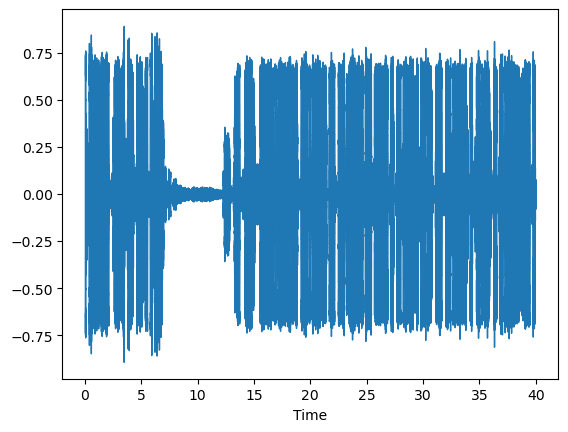

In [11]:
librosa.display.waveshow(audio_data_1D)

### Spectogram

In [12]:
D = librosa.stft(audio_data_1D)  # STFT of y
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

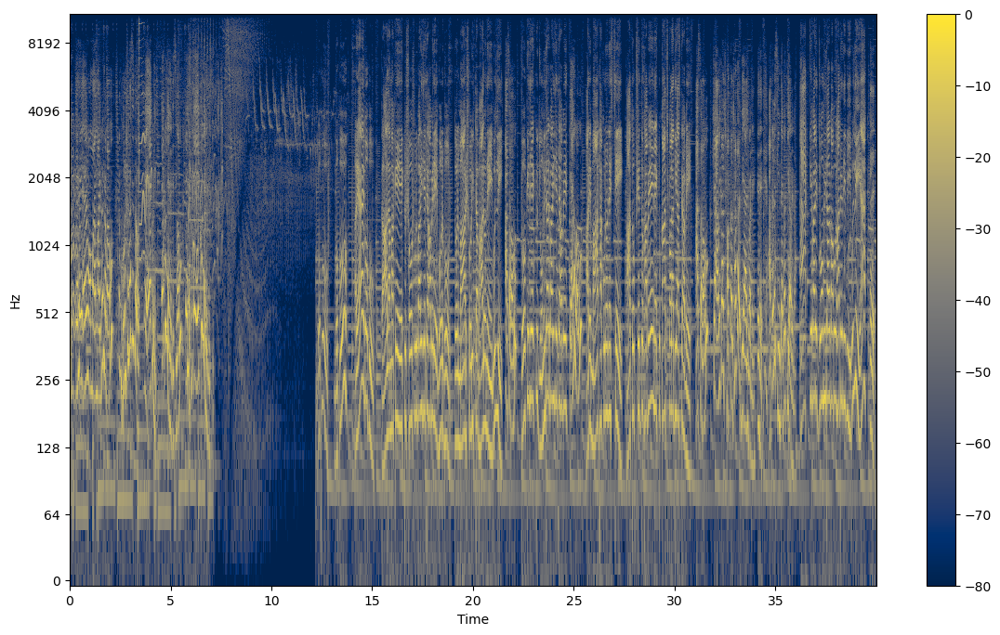

In [13]:
plt.figure(figsize = (14,8) )
librosa.display.specshow(S_db, x_axis='time', y_axis='log', cmap="cividis")
plt.colorbar()

### mel-spectogram

In [14]:
mel_spectogram = librosa.feature.melspectrogram(y=audio_data_1D, 
                                                sr=sampling_rate,
                )
print(mel_spectogram)

[[1.41223836e+00 4.90059525e-01 4.68772650e-02 ... 5.13948686e-03
  3.94831831e-03 4.63851728e-02]
 [1.63669074e+00 7.41629720e-01 1.22681625e-01 ... 1.32145941e-01
  1.41873181e-01 2.92334557e-01]
 [1.39131427e+00 2.34572721e+00 2.71867824e+00 ... 1.64951587e+00
  2.00137782e+00 2.33237171e+00]
 ...
 [4.37527124e-05 6.97419309e-05 1.03809216e-04 ... 1.67876933e-05
  9.00187933e-06 3.86912825e-06]
 [5.63011163e-05 4.80554227e-05 3.58241668e-05 ... 1.57455452e-06
  8.98384656e-07 6.70618419e-07]
 [2.40400077e-05 1.47887167e-05 4.19535809e-06 ... 6.15020042e-07
  2.85689737e-07 4.01761639e-07]]


In [15]:

mel_S_db = librosa.amplitude_to_db(mel_spectogram, ref=np.max)
mel_S_db

array([[-69.26707, -78.46025, -80.     , ..., -80.     , -80.     ,
        -80.     ],
       [-67.98589, -74.86149, -80.     , ..., -80.     , -80.     ,
        -80.     ],
       [-69.39672, -64.85968, -63.57807, ..., -67.9181 , -66.23865,
        -64.90927],
       ...,
       [-80.     , -80.     , -80.     , ..., -80.     , -80.     ,
        -80.     ],
       [-80.     , -80.     , -80.     , ..., -80.     , -80.     ,
        -80.     ],
       [-80.     , -80.     , -80.     , ..., -80.     , -80.     ,
        -80.     ]], dtype=float32)

## Audio Pre-processing using Transformer model

In [16]:
feature_extractor = WhisperFeatureExtractor.from_pretrained("openai/whisper-small")

In [17]:
import pathlib

In [18]:
pathlib.Path('/kaggle/input/bengaliai-speech/examples/Cartoon.wav')

PosixPath('/kaggle/input/bengaliai-speech/examples/Cartoon.wav')

In [19]:
audio, sr = librosa.load( pathlib.Path('/kaggle/input/bengaliai-speech/examples/Cartoon.wav') )
def pre_process() :
    features = feature_extractor(
        audio, 
        sampling_rate = 16000, 
        padding=True
    )
    
    return features

    

In [20]:
features = pre_process()
print(features)

{'input_features': [array([[ 1.020792  ,  0.641835  ,  0.6549037 , ...,  0.51925385,
         0.07609886,  0.62779266],
       [ 1.0260366 ,  0.61837316,  0.80522287, ...,  0.6385919 ,
         0.5469012 ,  0.6910401 ],
       [ 1.1083962 ,  0.77862316,  0.84424865, ...,  0.4897989 ,
         0.581273  ,  0.5726918 ],
       ...,
       [ 0.0017938 , -0.077811  , -0.11864221, ...,  0.02518177,
        -0.01939762, -0.1400044 ],
       [-0.2948979 , -0.3328209 , -0.32553136, ..., -0.06702197,
        -0.14509845, -0.2034074 ],
       [-0.29422283, -0.46590912, -0.39708662, ..., -0.35625172,
        -0.22273886, -0.3518777 ]], dtype=float32)]}


In [21]:
audio

array([-0.0166457 , -0.00940073,  0.00037074, ..., -0.0003637 ,
        0.00779556,  0.007589  ], dtype=float32)